## Notebook setup

In [1]:
from pathlib import Path
import sys

sys.path.insert(0, str(Path.cwd().parent / "src"))

from format_umap import format_umap_legend

In [2]:
import logging, warnings;
warnings.filterwarnings("ignore")

import scanpy as sc
import scanpy.external as sce
import numpy as np
import pandas as pd
import re
from pathlib import Path 

import warnings, scipy.sparse as sp, matplotlib, matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.pyplot import rc_context
import matplotlib.font_manager
import matplotlib.lines as lines


pd.set_option('display.max_rows', 200)

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['font.family'] = 'sans-serif'
matplotlib.rcParams['font.sans-serif'] = 'Arial'
matplotlib.rc('font', size=12)

sc.settings.n_jobs=-1
sc.set_figure_params(dpi=80, dpi_save=300, color_map='Spectral_r', vector_friendly=True, transparent=True)
sc.settings.figdir = '../output/figures/'
sc.settings.verbosity = 1 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

%matplotlib inline 
%config InlineBackend.figure_format = 'retina'

scanpy==1.9.8 anndata==0.10.5.post1 umap==0.5.5 numpy==1.26.4 scipy==1.12.0 pandas==2.2.1 scikit-learn==1.4.1.post1 statsmodels==0.14.1 igraph==0.11.4 pynndescent==0.5.11


In [3]:
def observe_variance(anndata_object):
    fig = plt.figure(figsize=(10,5))
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    # variance per principal component
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = anndata_object.uns['pca']['variance_ratio']
    ax1.scatter(x,y,s=4)
    ax1.set_xlabel('PC')
    ax1.set_ylabel('Fraction of variance explained\n')
    ax1.set_title('Fraction of variance explained per PC\n')
    # cumulative variance explained
    cml_var_explained = np.cumsum(anndata_object.uns['pca']['variance_ratio'])
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = cml_var_explained
    ax2.scatter(x,y,s=4)
    ax2.set_xlabel('PC')
    ax2.set_ylabel('Cumulative fraction of variance\nexplained')
    ax2.set_title('Cumulative fraction of variance\nexplained by PCs')
    fig.tight_layout()
    plot = plt.show
    return(plot)

In [4]:
# divergent
user_defined_palette =  [ '#3283FE', '#16FF32', '#F6222E',  '#FEAF16', '#BDCDFF', '#3B00FB', '#1CFFCE', '#C075A6', '#F8A19F', '#B5EFB5', '#FBE426', '#C4451C', '#2ED9FF', '#c1c119', '#8b0000', '#FE00FA', '#1CBE4F', '#1C8356', '#0e452b', '#AA0DFE', '#B5EFB5', '#325A9B', '#90AD1C']
# gradient of one color
user_defined_cmap_markers = LinearSegmentedColormap.from_list('mycmap', ["#E6E6FF", "#CCCCFF", "#B2B2FF", "#9999FF",  "#6666FF",   "#3333FF", "#0000FF"])
# gradient of two colors
user_defined_cmap_degs = LinearSegmentedColormap.from_list('mycmap', ["#0000FF", "#3333FF", "#6666FF", "#9999FF", "#B2B2FF", "#CCCCFF", "#E6E6FF", "#E6FFE6", "#CCFFCC", "#B2FFB2", "#99FF99", "#66FF66", "#33FF33", "#00FF00"])

In [5]:
%matplotlib inline 

In [6]:
heimli_list=[]

tenexdir = '/Users/akousa/Desktop/PROJECTS/[AK037] Thymus on Xenium/data/public/[2023.01.20] Heimli et al./GSE207204_RAW/'

h5_path = Path(tenexdir).glob('GSM*')

for path in h5_path:
   # print(path)
    tmp_adata = sc.read_h5ad(str(path))
    sc.pp.filter_cells(tmp_adata, min_genes=2000)
    heimli_list.append(tmp_adata)

In [7]:
heimli_adata = sc.concat(
    heimli_list, # add more annadata objects here separated by commas
    join='outer', 
    label = 'sample',
    keys = ['D2_CD45depleted',	'D5_APCenriched', 'D4_unenriched', 'D4_APCenriched', 'D3_APCenriched', 
            'D1_CD45depleted', 'D2_unenriched', 'D5_unenriched', 'D3_unenriched', 'D2_PBMC',
            'D3_CD45depleted', 'D4_PBMC', 'D1_APCenriched', 'D5_PBMC', 'D1_PBMC',
            'D4_CD45depleted', 'D2_APCenriched', 'D1_unenriched', 'D5_CD45depleted', 'D3_PBMC'], # or use your sample_names list (as used above) here. 
    # Make sure the order of the batch categories matches that of the AnnData objects 
    index_unique = '-')

In [8]:
heimli_adata.var = heimli_list[1].var

In [9]:
heimli_adata.raw = heimli_adata # keep a copy of the raw adata 
np.random.seed(42) 
index_list = np.arange(heimli_adata.shape[0]) # randomize the order of cells for plotting
np.random.shuffle(index_list)
heimli_adata = heimli_adata[index_list]

In [10]:
sc.pp.calculate_qc_metrics(heimli_adata, inplace=True)

#store unfiltered/unprocessed data into new fields prior to downstream analysis
heimli_adata.obs['original_total_counts'] = heimli_adata.obs['total_counts']
heimli_adata.obs['log10_original_total_counts'] = np.log10(heimli_adata.obs['original_total_counts'])

# select mitochondrial, ribosomal and hemoglobin genes (case sensitive)
heimli_adata.var['mt'] = heimli_adata.var_names.str.startswith(('MT-', 'mt-'))
heimli_adata.var['ribo'] = heimli_adata.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl'))
heimli_adata.var['hb'] = heimli_adata.var_names.str.startswith(('HB', 'Hb'))

# for each cell compute fraction of counts in mitochondrial, ribosomal and hemoglobin genes vs. all genes 
heimli_adata.obs['mito_frac'] = np.sum(heimli_adata[:,heimli_adata.var['mt']==True].X, axis=1) / np.sum(heimli_adata.X, axis=1)
heimli_adata.obs['ribo_frac'] = np.sum(heimli_adata[:,heimli_adata.var['ribo']==True].X, axis=1) / np.sum(heimli_adata.X, axis=1)
heimli_adata.obs['hb_frac'] = np.sum(heimli_adata[:,heimli_adata.var['hb']==True].X, axis=1) / np.sum(heimli_adata.X, axis=1)

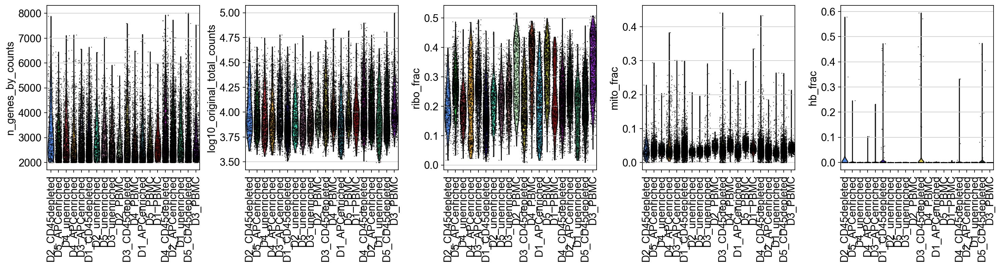

In [11]:
sc.pl.violin(heimli_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [12]:
sc.external.pp.scrublet(heimli_adata, threshold=0.1, random_state=42) # run scrublet to predict potential doublets

Detected doublet rate = 7.9%
Estimated detectable doublet fraction = 60.4%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 13.1%


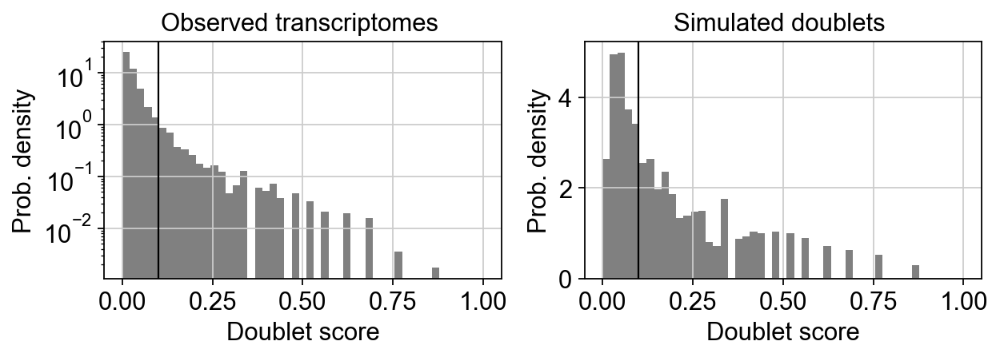

In [13]:
sc.external.pl.scrublet_score_distribution(heimli_adata) # inspect automatic threshold

In [14]:
sc.pp.filter_genes(heimli_adata, min_cells=1) # remove columns with all 0s

In [15]:
heimli_adata = heimli_adata[:,heimli_adata.var['ribo']==False]
heimli_adata.shape # check number of genes after ribosomal gene removal

(28028, 31246)

In [16]:
heimli_adata = heimli_adata[:,heimli_adata.var['hb']==False]
heimli_adata.shape # check number of genes after hemoglobin gene removal

(28028, 31233)

In [17]:
sc.pp.normalize_per_cell(heimli_adata, counts_per_cell_after=10**4)

In [18]:
sc.pp.log1p(heimli_adata)

In [19]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(heimli_adata, n_comps=200, svd_solver='arpack', random_state=rng)

<function matplotlib.pyplot.show(close=None, block=None)>

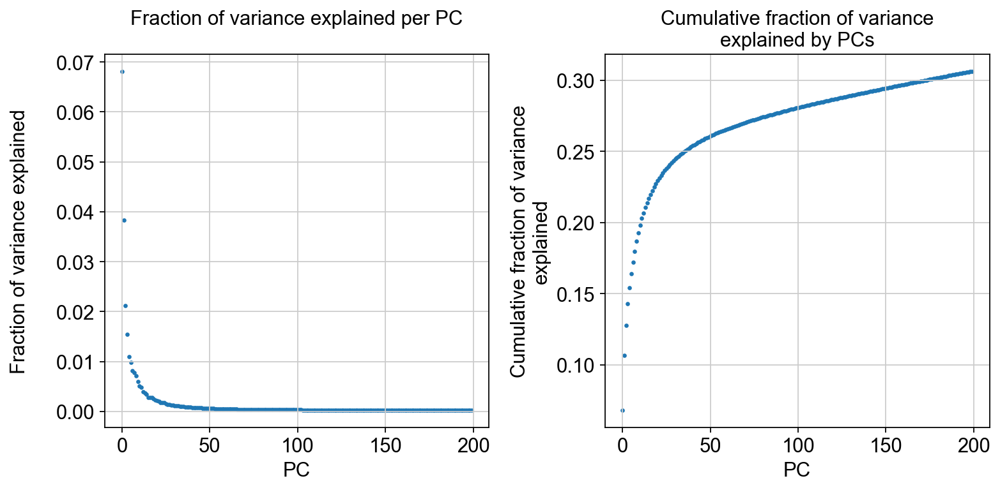

In [20]:
observe_variance(heimli_adata)

In [21]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(heimli_adata, n_comps=25,  svd_solver='arpack', random_state=rng)
sc.pp.neighbors(heimli_adata, n_neighbors=15, random_state=rng) # set seed
sc.tl.umap(heimli_adata)

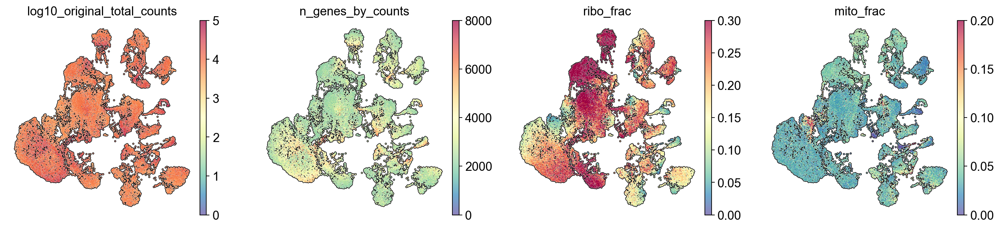

In [22]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    heimli_adata, 
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    #size=5,
    frameon=False,
    add_outline=True,
    sort_order = False, 
    vmax=[5,8000, 0.3, 0.2],
   vmin=0
)

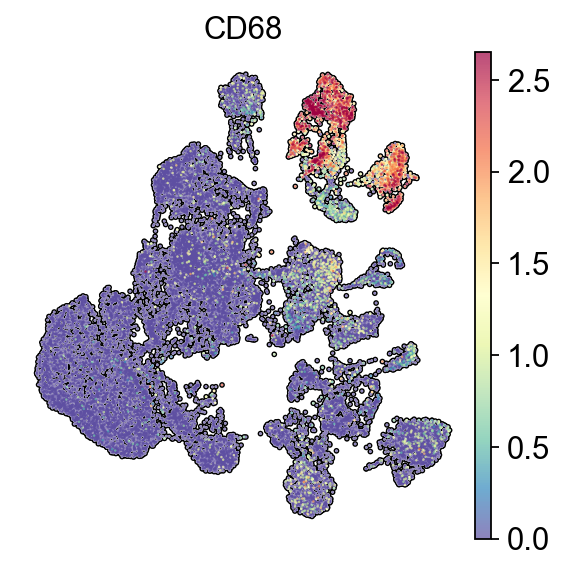

In [23]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    heimli_adata, 
    color=['CD68'], 
    color_map='Spectral_r', 
    palette=user_defined_palette,
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=5,
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmax='p99'
)

In [24]:
heimli_adata.obs['group'] = ['PBMC' if 'PBMC' in x else 'CD45depleted' if 'CD45depleted' in x else 
                             'APCenriched' if 'APCenriched' in x else 'unenriched' if 'unenriched' in x else       
                              'error' for x in heimli_adata.obs['sample'] ]

In [25]:
heimli_adata.obs['id'] = ['D1' if 'D1' in x else 'D2' if 'D2' in x else 'D3' if 'D3' in x else 
                          'D4' if 'D4' in x else 'D5' if 'D5' in x else 'error' for x in heimli_adata.obs['sample'] ]

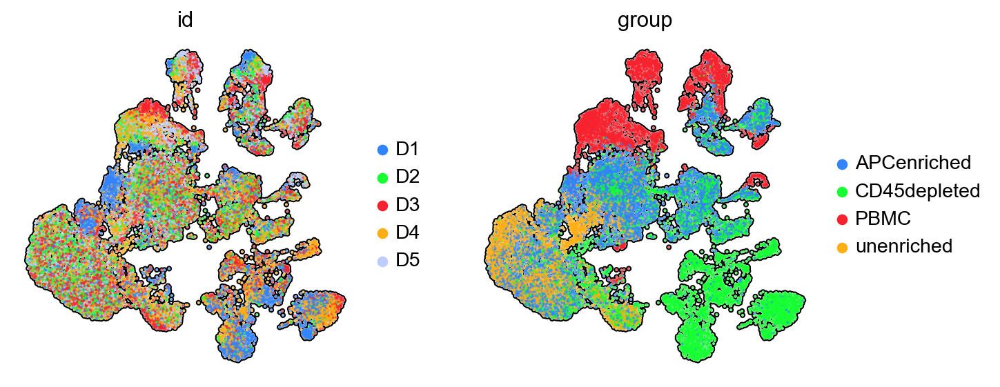

In [26]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    heimli_adata, 
    color=['id', 'group'], 
    color_map='Spectral_r', 
    palette=user_defined_palette,
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=10,
    frameon=False,
    add_outline=True,
    sort_order = False,
    vmax='p99'
)

In [27]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(heimli_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

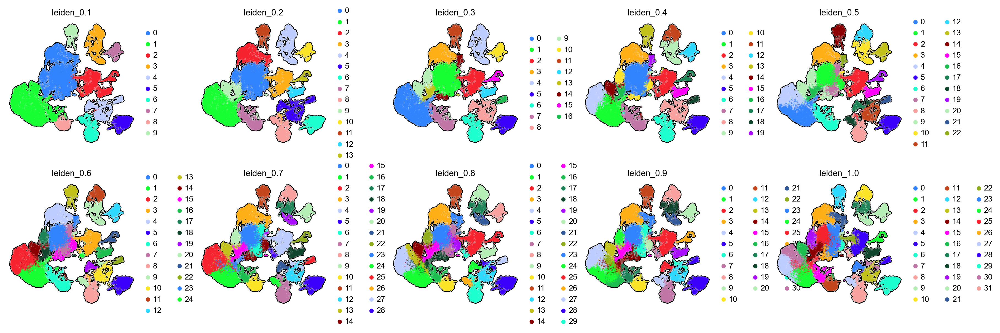

In [28]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    heimli_adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

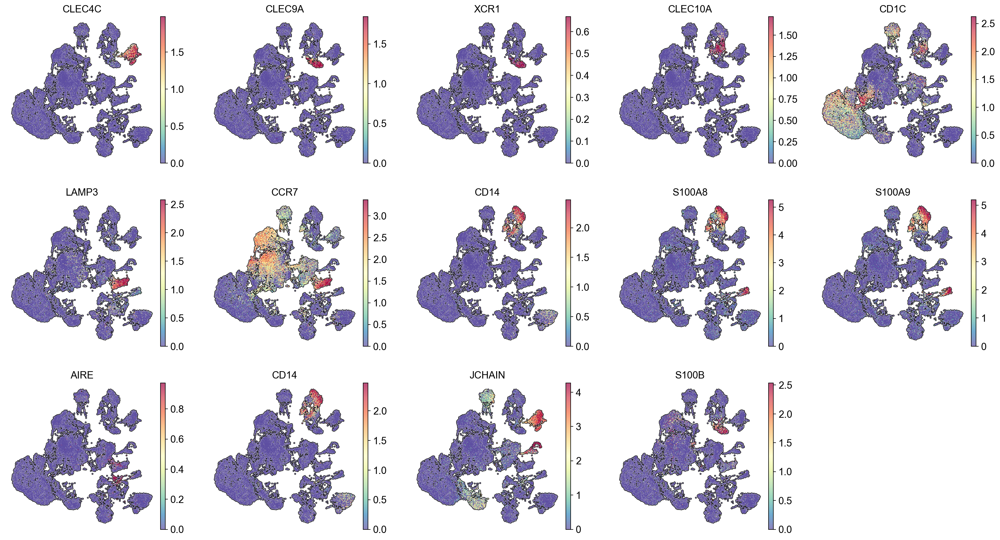

In [29]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    heimli_adata, 
    color=['CLEC4C', 'CLEC9A', 'XCR1', 'CLEC10A', 'CD1C', 'LAMP3', 'CCR7', 'CD14', 'S100A8', 'S100A9','AIRE', 'CD14', 'JCHAIN', 'S100B'], 
    color_map='Spectral_r', 
    palette=user_defined_palette,
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=5,
    frameon=False,
    add_outline=True,
    sort_order = False,
    vmax='p99'
)

In [30]:
heimli_adata_memo = heimli_adata

In [31]:
clusters_to_remove = ['13' ]
cluster_filter = [x not in clusters_to_remove for x in heimli_adata.obs['leiden_0.7']]
print('Total number of cells pre-filtering: ' + str(heimli_adata.shape[0]))
print('Number of cells to keep after filtering: ' + str(sum(cluster_filter)))
heimli_adata_filtered = heimli_adata[cluster_filter]

Total number of cells pre-filtering: 28028
Number of cells to keep after filtering: 27303


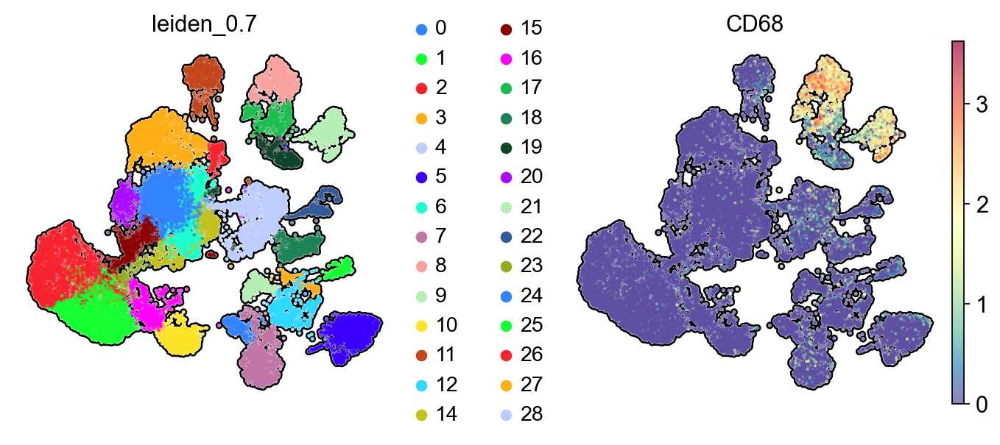

In [32]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    heimli_adata_filtered, 
    color=['leiden_0.7', 'CD68'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [33]:
heimli_adata = heimli_adata_filtered

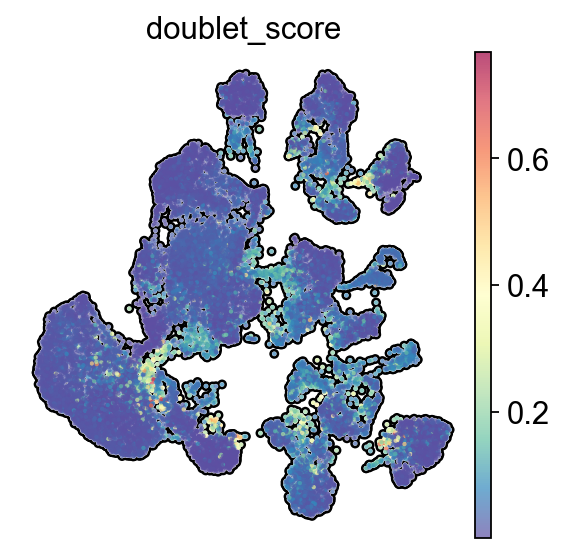

In [34]:
sc.pl.umap(
    heimli_adata, 
    color=[ 'doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [35]:
heimli_adata = heimli_adata[heimli_adata.obs['predicted_doublet'] == False] # remove cells annotated as doublets

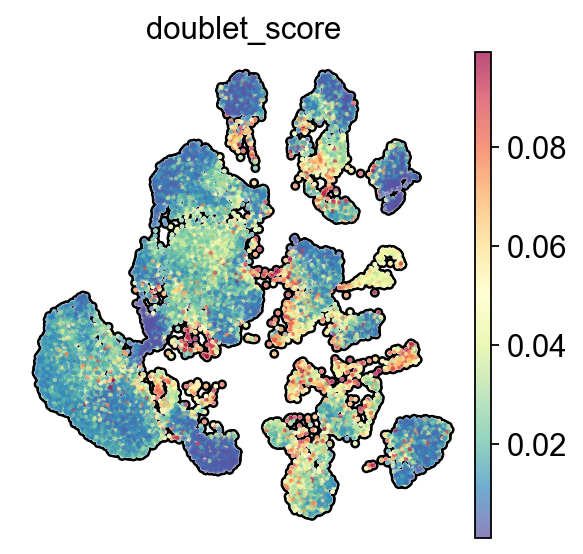

In [36]:
sc.pl.umap(
    heimli_adata, 
    color=[ 'doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [37]:
heimli_adata.shape

(25158, 31233)

In [38]:
heimli_adata.obs['keep_cell'] = '0.yes'
keep_cells = pd.concat([heimli_adata.obs['keep_cell']])
heimli_adata_memo.obs['keep_cell'] = '1.no'

In [39]:
heimli_adata_memo.obs['keep_cell'][heimli_adata_memo.obs.index.isin(keep_cells.index) == True] = '0.yes'

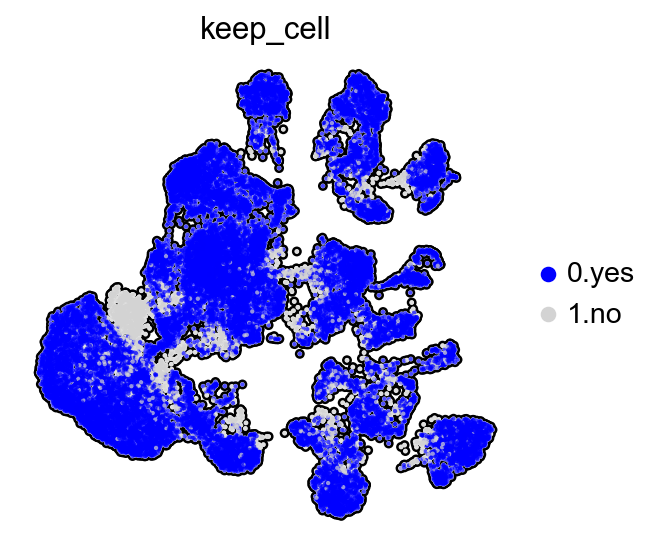

In [40]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    heimli_adata_memo, 
    color=['keep_cell'], 
    palette=['blue',  '#d3d3d3'],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [41]:
crosstb = pd.crosstab(heimli_adata_memo.obs['sample'], heimli_adata_memo.obs['keep_cell'])

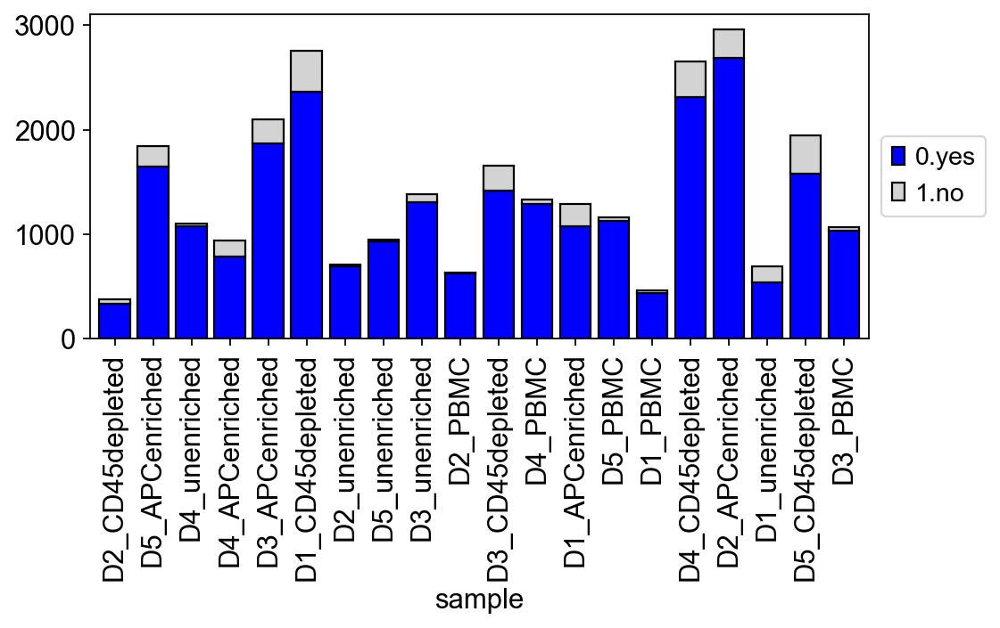

In [42]:
with rc_context({'figure.figsize': (7, 3)}):
    ax = crosstb.plot(kind="bar", stacked=True, edgecolor = "black", width=0.8,  color=['blue', '#d3d3d3'])
    ax.grid(False) 
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # to save plot unhash the line bellow
    #plt.savefig('barplot_keepcells_S1.pdf')
    plt.show()

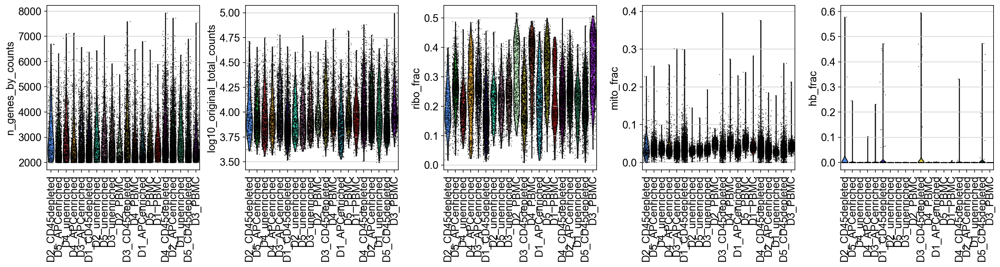

In [43]:
sc.pl.violin(heimli_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [44]:
heimli_adata = heimli_adata[heimli_adata.obs['group']!='PBMC']

In [45]:
sc.pp.highly_variable_genes(heimli_adata, n_top_genes=2000, n_bins=20, flavor='seurat',  inplace=True)

In [46]:
rng = np.random.RandomState(42)
heimli_adata = sc.tl.pca(heimli_adata, n_comps=200, copy = True, svd_solver='arpack', random_state=rng, use_highly_variable=True)

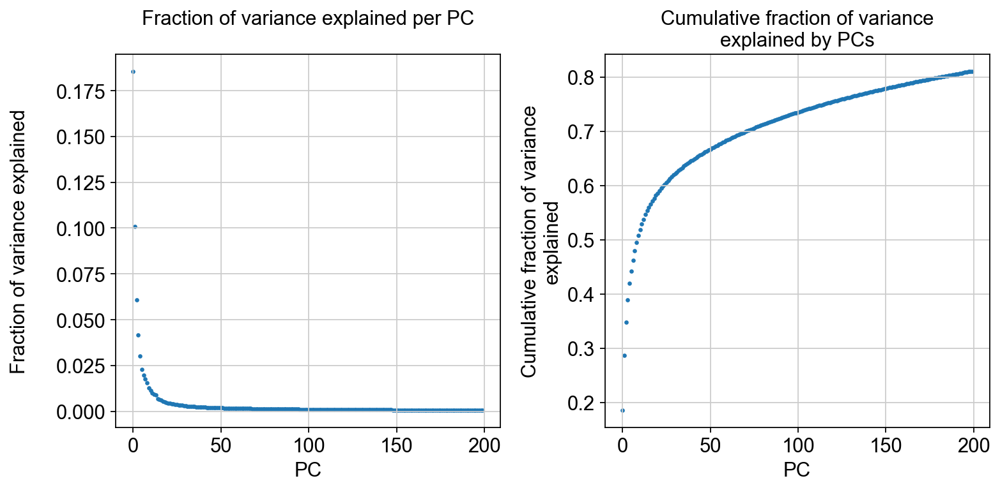

In [47]:
observe_variance(heimli_adata)
plt.show()

In [48]:
rng = np.random.RandomState(42) # use seed
sc.tl.pca(heimli_adata, n_comps=20, svd_solver='arpack', random_state=rng, use_highly_variable=True)
sce.pp.harmony_integrate(heimli_adata, 'id')
sc.pp.neighbors(heimli_adata, n_neighbors=15, use_rep='X_pca_harmony', random_state=rng)
sc.tl.umap(heimli_adata)

2026-08-31 23:01:00,640 - harmonypy - INFO - Iteration 1 of 10
2026-08-31 23:01:02,986 - harmonypy - INFO - Iteration 2 of 10
2026-08-31 23:01:05,367 - harmonypy - INFO - Iteration 3 of 10
2026-08-31 23:01:07,651 - harmonypy - INFO - Iteration 4 of 10
2026-08-31 23:01:10,113 - harmonypy - INFO - Iteration 5 of 10
2026-08-31 23:01:11,824 - harmonypy - INFO - Converged after 5 iterations


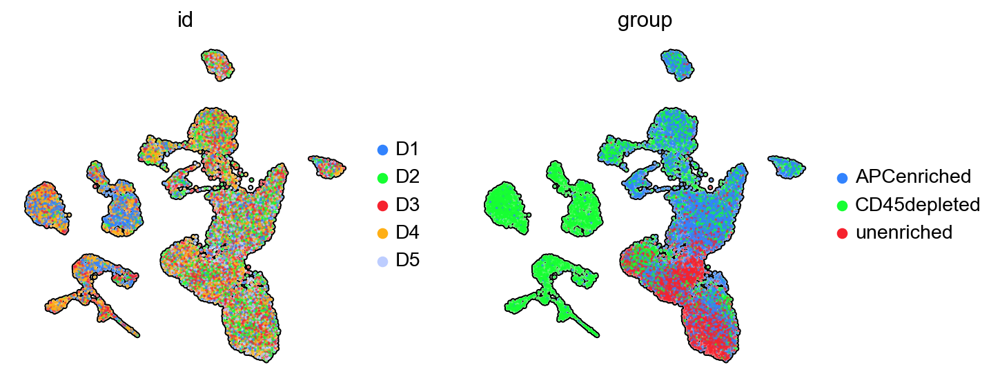

In [49]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    heimli_adata, 
    color=['id', 'group'], 
    color_map='Spectral_r', 
    palette=user_defined_palette,
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=10,
    frameon=False,
    add_outline=True,
    sort_order = False,
    vmax='p99'
)

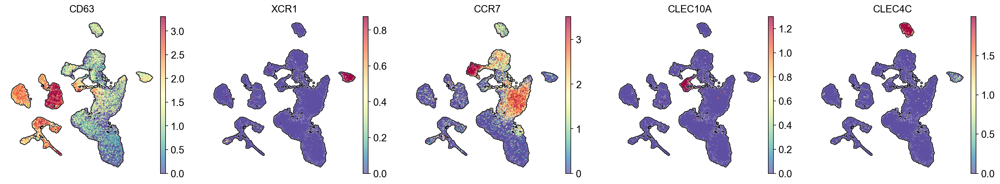

In [50]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    heimli_adata, 
    color=['CD63', 'XCR1', 'CCR7', 'CLEC10A', 'CLEC4C'], 
    color_map='Spectral_r', 
    palette=user_defined_palette,
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=10,
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmax='p99'
)

In [51]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(heimli_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

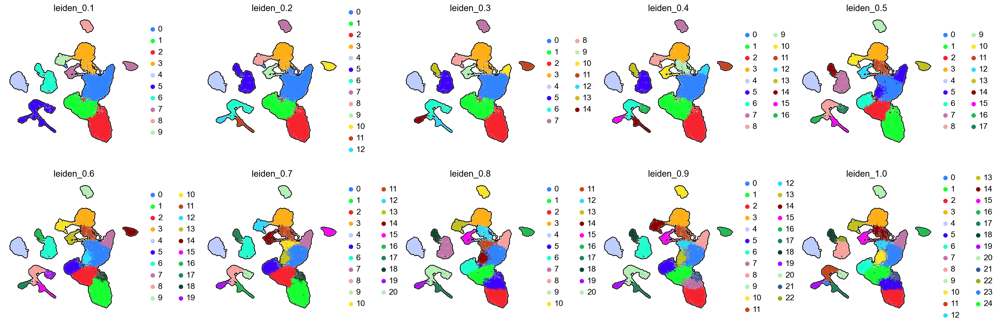

In [52]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    heimli_adata, 
    color=[ 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5',
            'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [53]:
heimli_adata.obs['cell_type'] = ['TEC' if (x=='6' or x=='12' or x=='14') else 'EC' if x=='4' else 'FB' if x=='5' else 'vSMC' if x=='13' else 
                                 'B' if (x=='3') else 'DC' if (x=='7' or x=='8' or x=='9' or x=='11') else 'T' for x in heimli_adata.obs['leiden_0.3'] ]

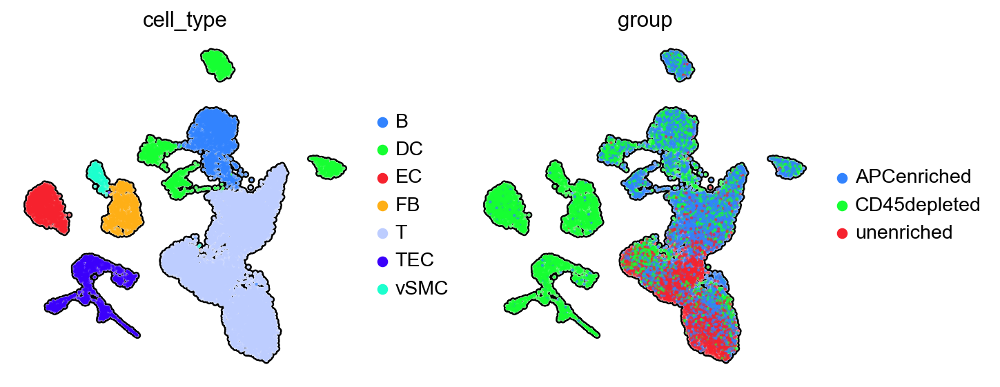

In [54]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    heimli_adata, 
    color=['cell_type', 'group'], 
    color_map='Spectral_r', 
    palette=user_defined_palette,
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False,
    vmax='p99'
)

### Dendritic cells (no pDCs)

In [55]:
heimli_adata_DC = heimli_adata[(heimli_adata.obs['leiden_0.3']=='8') | (heimli_adata.obs['leiden_0.3']=='9') | (heimli_adata.obs['leiden_0.3']=='11')].copy()

In [56]:
# Remove columns with all 0s
sc.pp.filter_genes(heimli_adata_DC, min_cells=1)

In [57]:
sc.pp.highly_variable_genes(heimli_adata_DC, n_top_genes=3500, n_bins=20, flavor='seurat',  inplace=True)

In [58]:
rng = np.random.RandomState(42)
sc.tl.pca(heimli_adata_DC, n_comps=10, svd_solver='arpack', random_state=rng, use_highly_variable=True)
sce.pp.harmony_integrate(heimli_adata_DC, 'id')
sc.pp.neighbors(heimli_adata_DC, n_neighbors=15, use_rep='X_pca_harmony', random_state=rng)
sc.tl.umap(heimli_adata_DC)

2026-08-31 23:02:03,283 - harmonypy - INFO - Iteration 1 of 10
2026-08-31 23:02:03,370 - harmonypy - INFO - Iteration 2 of 10
2026-08-31 23:02:03,455 - harmonypy - INFO - Iteration 3 of 10
2026-08-31 23:02:03,544 - harmonypy - INFO - Iteration 4 of 10
2026-08-31 23:02:03,654 - harmonypy - INFO - Iteration 5 of 10
2026-08-31 23:02:03,848 - harmonypy - INFO - Converged after 5 iterations


In [59]:
heimli_adata_DC.obs['donor'] = heimli_adata_DC.obs['id']

In [60]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(heimli_adata_DC, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

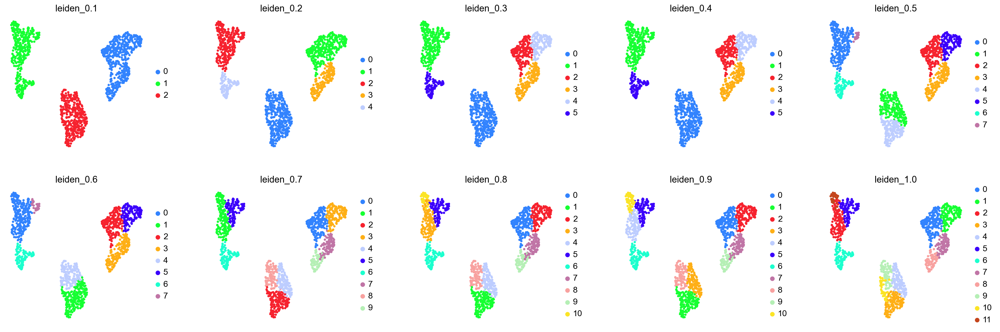

In [61]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    heimli_adata_DC, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    size=50,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
   # add_outline=True,
    sort_order = False
)

In [62]:
heimli_adata_DC.obs['cell_type_subset'] = ['DC:cDC1' if (x=='2') else 'DC:aDC' if x=='0' else 'DC:cDC2' 
                                           for x in heimli_adata_DC.obs['leiden_0.1']]

In [63]:
#FED789FF, #023743FF, #72874EFF, #476F84FF, #A4BED5FF, #453947FF

In [64]:
heimli_adata_DC.uns['cell_type_subset_colors'] = ['#F6222E', '#B5EFB5', '#AA0DFE']
heimli_adata_DC.uns['donor_colors'] = ['#FBA72AFF', '#D3D4D8FF', '#CB7A5CFF', '#5785C1FF', '#72874EFF']

In [65]:
heimli_adata_DC.obs['cell_type_subset'] = pd.Categorical(
heimli_adata_DC.obs['cell_type_subset'],
categories=["DC:aDC", "DC:cDC1", "DC:cDC2"],
ordered=True)

In [66]:
DC1_mouse = ['Ppt1',	'Xcr1',	'Rab7b',	'Ifi205',	'Naaa',	'Psap',	'Cadm1',	'Irf8',	'P2ry14',	'Clec9a',	'BC028528',	'Plbd1',	'Gpr141b',	'Atpif1',	'Camk1d',	'Cst3',	'Plpp1',	'Txndc15',	'Cd36',	'Gcsam',	'Cd24a',	'Arsb',	'Mpeg1',	'Cyb5a',	'Mctp1',	'Wdfy4',	'Gusb',	'Plin2',	'Hepacam2',	'Eef1b2',]
DC2_mouse = ['S100a6',	'Fcer1g',	'Ms4a6c',	'Ms4a4c',	'Ctss',	'S100a4',	'Ifitm3',	'Cd300a',	'Tyrobp',	'Ifitm2',	'Fth1',	'Wfdc17',	'Ctsa',	'Ifi30',	'Sirpa',	'Arhgdib',	'Pitpna',	'Ms4a6b',	'Ctsh',	'Lgals3',	'Rac2',	'Eno1',	'Fgr',	'Mcemp1',	'Cd209a',	'Cybb',	'Csf1r',	'Ms4a6d',	'Arl6ip5',	'Limd2']
aDC_mouse = ['Fscn1',	'Anxa3',	'Cd63',	'Tmem123',	'Samsn1',	'Tmcc3',	'Relb',	'Epsti1',	'Gadd45b',	'Cacnb3',	'Ccl5',	'Socs2',	'Spint2',	'Traf1',	'Pcgf5',	'Nudt17',	'Rftn1',	'Marcksl1',	'Iscu',	'B2m',	'AW112010',	'Pakap-1',	'Mreg',	'Lamp1',	'Birc2',	'Serpinb6b',	'Zmynd15',	'Psme2',	'Ankrd33b',	'Strip2']

DC1_human = [g.upper() for g in DC1_mouse]
DC2_human = [g.upper() for g in DC2_mouse]
aDC_human = [g.upper() for g in aDC_mouse]

In [67]:
DC1_genes = [g for g in DC1_human if g in heimli_adata_DC.var_names]
DC2_genes = [g for g in DC2_human if g in heimli_adata_DC.var_names]
aDC_genes = [g for g in aDC_human if g in heimli_adata_DC.var_names]

print("DC1:", DC1_genes)
print("DC2:", DC2_genes)
print("aDC:", aDC_genes)

DC1: ['PPT1', 'XCR1', 'RAB7B', 'NAAA', 'PSAP', 'CADM1', 'IRF8', 'P2RY14', 'CLEC9A', 'PLBD1', 'CAMK1D', 'CST3', 'PLPP1', 'TXNDC15', 'CD36', 'GCSAM', 'ARSB', 'MPEG1', 'CYB5A', 'MCTP1', 'WDFY4', 'GUSB', 'PLIN2', 'EEF1B2']
DC2: ['S100A6', 'FCER1G', 'CTSS', 'S100A4', 'IFITM3', 'CD300A', 'TYROBP', 'IFITM2', 'FTH1', 'CTSA', 'IFI30', 'SIRPA', 'ARHGDIB', 'PITPNA', 'CTSH', 'LGALS3', 'RAC2', 'ENO1', 'FGR', 'MCEMP1', 'CYBB', 'CSF1R', 'ARL6IP5', 'LIMD2']
aDC: ['FSCN1', 'ANXA3', 'CD63', 'TMEM123', 'SAMSN1', 'TMCC3', 'RELB', 'EPSTI1', 'GADD45B', 'CACNB3', 'CCL5', 'SOCS2', 'SPINT2', 'TRAF1', 'PCGF5', 'NUDT17', 'RFTN1', 'MARCKSL1', 'ISCU', 'B2M', 'MREG', 'LAMP1', 'BIRC2', 'ZMYND15', 'PSME2', 'ANKRD33B', 'STRIP2']


In [68]:
sc.tl.score_genes(
    heimli_adata_DC,
    gene_list=DC1_genes,
    score_name="DC1_score",
    use_raw=False
)

sc.tl.score_genes(
    heimli_adata_DC,
    gene_list=DC2_genes,
    score_name="DC2_score",
    use_raw=False
)

sc.tl.score_genes(
    heimli_adata_DC,
    gene_list=aDC_genes,
    score_name="aDC_score",
    use_raw=False
)


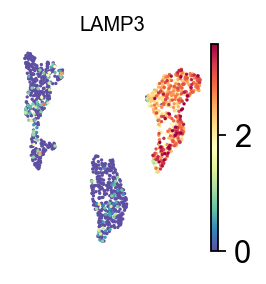

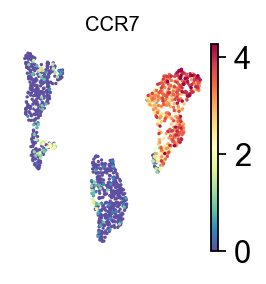

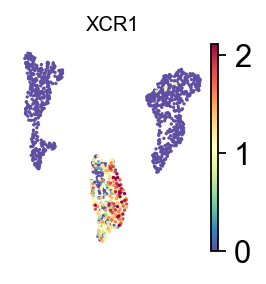

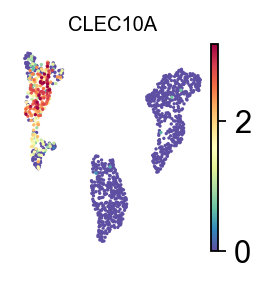

In [69]:
sc.set_figure_params(
    dpi=80,
    dpi_save=300,
    color_map="viridis",
    vector_friendly=True,
    transparent=True,
)

for color, title in [
    ('LAMP3', 'LAMP3'),
    ('CCR7', 'CCR7'),
    ('XCR1', 'XCR1'),
    ('CLEC10A', 'CLEC10A'),
]:

    ax = sc.pl.umap(
        heimli_adata_DC,
        color=color,
        color_map="Spectral_r",
        use_raw=False,
        size=9,
        outline_width=[0.6, 0.05],
        frameon=False,
        add_outline=False,
        sort_order=True,
        vmax="p99",
        show=False,
    )

    ax.set_title(title, fontsize=9)

    if ax.get_legend() is not None:
        format_umap_legend(ax)

    fig = ax.figure
    fig.set_size_inches(1.7, 1.7)

    fig.savefig(
        f"UMAP_{color}_merged.pdf",
        dpi=300,
        bbox_inches="tight",
        transparent=True,
    )

    plt.show()

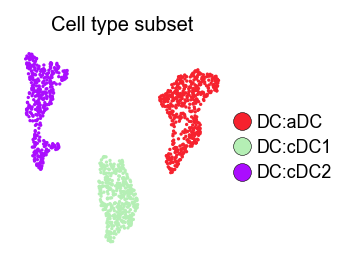

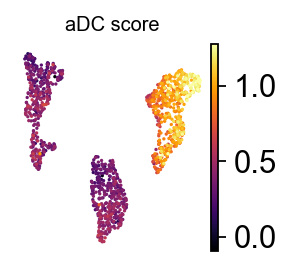

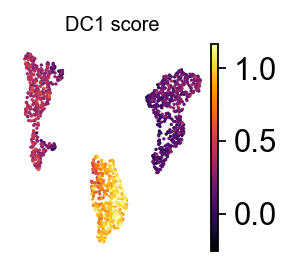

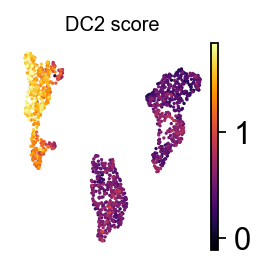

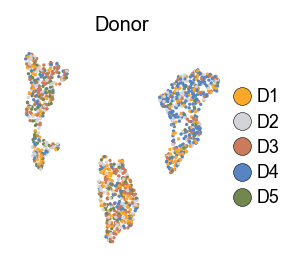

In [73]:
sc.set_figure_params(
    dpi=80,
    dpi_save=300,
    color_map="viridis",
    vector_friendly=True,
    transparent=True,
)

for color, title in [
    ("cell_type_subset", 'Cell type subset'),
    ("aDC_score", "aDC score"),
    ("DC1_score", "DC1 score"),
    ("DC2_score", "DC2 score"),
    ("donor", 'Donor'),
]:

    ax = sc.pl.umap(
        heimli_adata_DC,
        color=color,
        color_map="inferno",
        use_raw=False,
        size=9,
        outline_width=[0.6, 0.05],
        frameon=False,
        add_outline=False,
        sort_order=True,
        vmax="p99",
        show=False,
    )

    ax.set_title(title, fontsize=9)

    if ax.get_legend() is not None:
        format_umap_legend(ax)

    fig = ax.figure
    fig.set_size_inches(1.7, 1.7)

    fig.savefig(
        f"UMAP_{color}.pdf",
        dpi=300,
        bbox_inches="tight",
        transparent=True,
    )

    plt.show()